In [1]:
import numpy as np
import skimage as sk
import skimage.io as skio
import skimage.transform
from skimage.filters import threshold_yen
from skimage.exposure import rescale_intensity
from skimage import exposure

In [13]:
#removes the frayed edges of the image with a relative crop
def crop_edges(im, perc=0.06):
    height, width = im.shape
    a, b = perc, 1-perc
    new_im = im[int(a * height):int(b * height), int(a * width):int(b * width)]
    return new_im

#split the image into the 3 channels: red, green, blue
def get_channels(im):
    height = np.floor(im.shape[0] / 3.0).astype(np.int)
    b = im[:height]
    g = im[height: 2*height]
    r = im[2*height: 3*height]
    return (r, g, b)

#compute similarity score, closer to 0 = more similar
def ssd_score(image1, image2):
    return np.sum(np.sum(np.square(image1-image2)))

#create image pyramids to align the 3 channels
def align(image1, image2, pyramids=5):
    best_x, best_y = 0,0
    #create pyramids in top down order
    for p in reversed(range(pyramids)):
        scale = (0.5 ** p)
        one = sk.transform.rescale(image1, scale)
        two = sk.transform.rescale(image2, scale)  
        #if it's the smallest scaled img, just loop over enitre picture since it's small.
        if p+1 == pyramids:
            height, width = one.shape
            range_x, range_y = [0, width], [0, height]   
        #otherwise take the previous adjustment, and go through the ones in between for more minute adjustment
        else:
            range_x, range_y = [(best_x-1) * 2, (best_x+1) * 2], [(best_y-1) * 2, (best_y+1) * 2]
        best = float('inf')
        for i in range(range_x[0], range_x[1]):
            modded_x = np.roll(one, i, axis=0)
            for j in range(range_y[0], range_y[1]):
                final_mod = np.roll(modded_x, j, axis=1)
                score = ssd_score(final_mod, two)
                if score < best:
                    best = score
                    best_x, best_y = i,j
    return (best_x, best_y)

#colorizes the original image
def colorize(file):
    imname = 'data/' + file
    im = skio.imread(imname)
    height, width = im.shape
    im = sk.img_as_float(im)
    
    r, g, b = get_channels(im)
    
    r = crop_edges(r)
    g = crop_edges(g)
    b = crop_edges(b)
    
    r_adj = align(r, b)
    g_adj = align(g, b)
    
    r = np.roll(r, r_adj[0], axis=0)
    r = np.roll(r, r_adj[1], axis=1)
    g = np.roll(g, g_adj[0], axis=0)
    g = np.roll(g, g_adj[1], axis=1)
    print("Red adjustment: " + str(r_adj))
    print("Green adjustment: " + str(g_adj))
    
    im_out = np.dstack([r, g, b])
    fname = 'img/portfolio/' + str(file.split('.')[0]) + '.jpg'
    skio.imsave(fname, im_out)
    return im_out

#Normalizes the intensity values in the image to add contrast
def add_contrast(img, file):
    p2, p98 = np.percentile(img, (2, 98))
    im_out = exposure.rescale_intensity(img, in_range=(p2, p98))
    fname = 'img/portfolio/' + str(file.split('.')[0]) + '-contrast.jpg'
    skio.imsave(fname, im_out)
    return im_out



Run cell below for main assignment

workshop.tif
Red adjustment: (104, -12)
Green adjustment: (52, 0)


Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


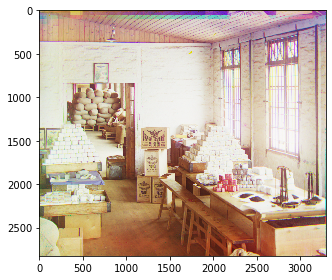

emir.tif
Red adjustment: (0, 2153)
Green adjustment: (49, 24)


Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


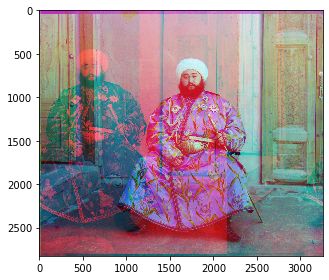

greenroom.tif
Red adjustment: (127, 35)
Green adjustment: (59, 28)


Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


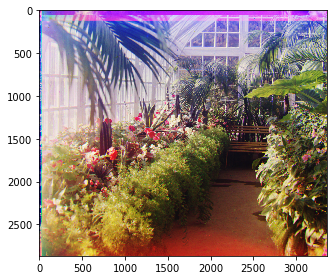

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


hut.jpg
Red adjustment: (13, 5)
Green adjustment: (6, 3)


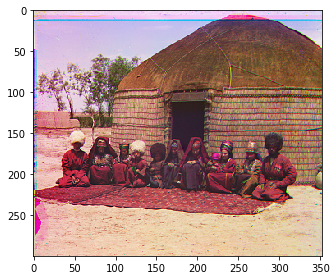

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


monastery.jpg
Red adjustment: (3, 2)
Green adjustment: (-3, 2)


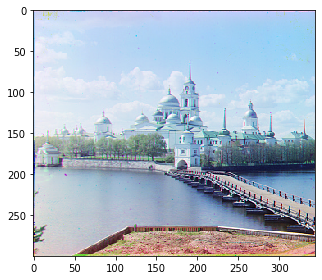

three_generations.tif
Red adjustment: (112, 11)
Green adjustment: (53, 14)


Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


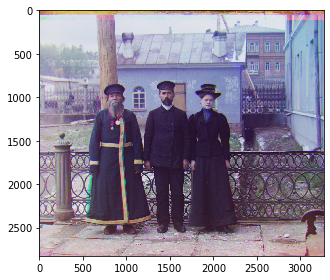

castle.tif
Red adjustment: (98, 4)
Green adjustment: (35, 3)


Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


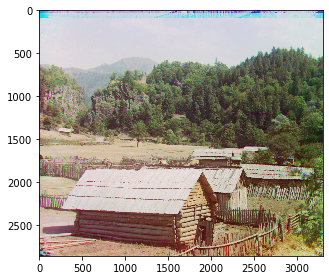

melons.tif
Red adjustment: (179, 13)
Green adjustment: (82, 10)


Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


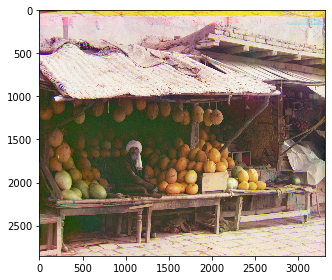

onion_church.tif
Red adjustment: (108, 36)
Green adjustment: (51, 26)


Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


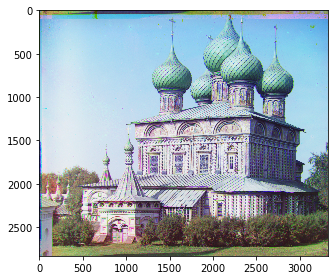

ledge.tif
Red adjustment: (102, -10)
Green adjustment: (42, -12)


Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


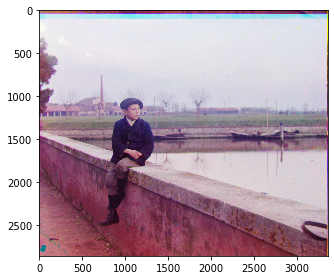

train.tif
Red adjustment: (87, 31)
Green adjustment: (42, 5)


Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


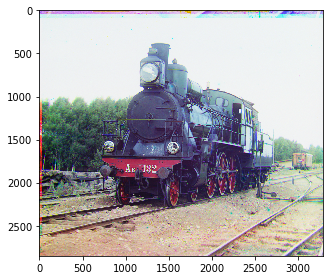

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


tobolsk.jpg
Red adjustment: (6, 3)
Green adjustment: (3, 3)


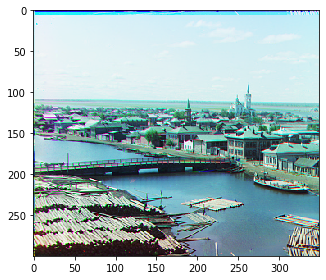

icon.tif
Red adjustment: (89, 23)
Green adjustment: (40, 17)


Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


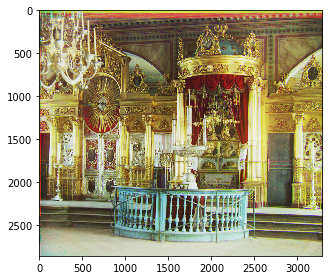

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


cathedral.jpg
Red adjustment: (0, 0)
Green adjustment: (3, 2)


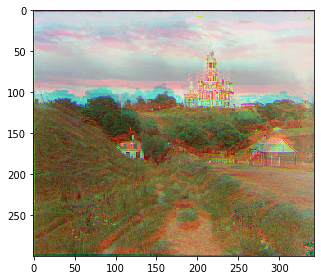

self_portrait.tif
Red adjustment: (176, 36)
Green adjustment: (78, 28)


Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


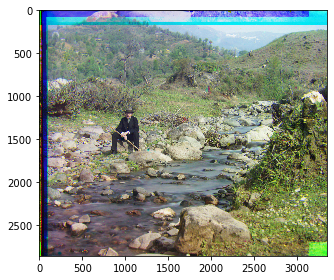

harvesters.tif
Red adjustment: (124, 13)
Green adjustment: (59, 16)


Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


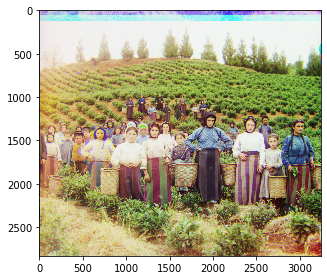

lady.tif
Red adjustment: (113, 11)
Green adjustment: (47, 9)


Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


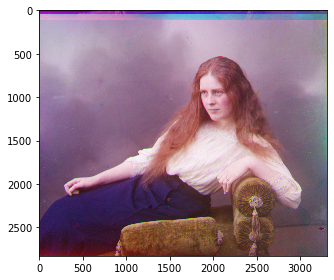

In [28]:
from os import listdir
from os.path import isfile, join

#get all the pictures
files = [f for f in listdir('data/') if isfile(join('data/', f))]
colorized = []
for file in files:
    print(file)
    im_out = colorize(file)
    colorized.append((file, im_out))
    skio.imshow(im_out)
    skio.show()


Run cell below for Bells and Whistles: Auto adding contrast

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


Before


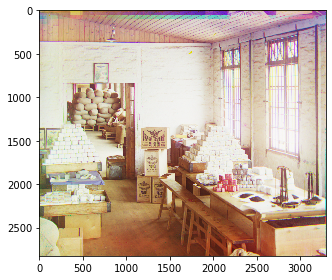

After


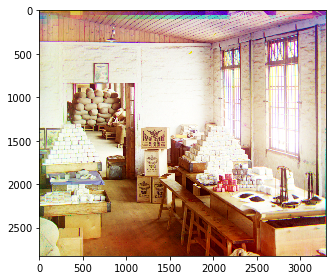

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


Before


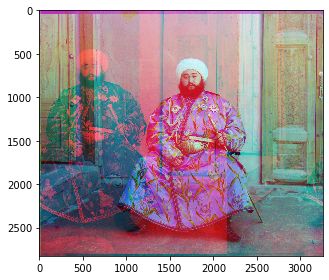

After


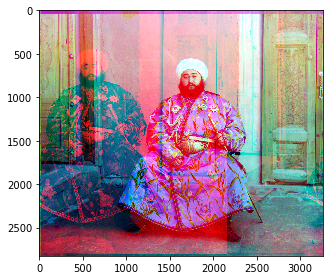

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


Before


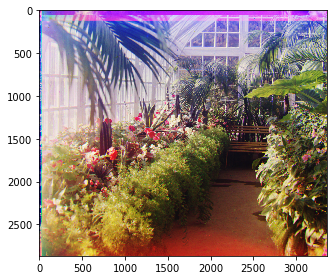

After


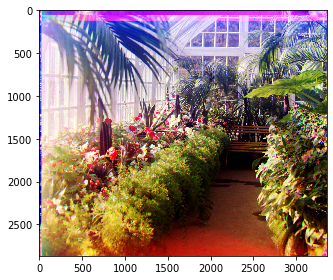

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


Before


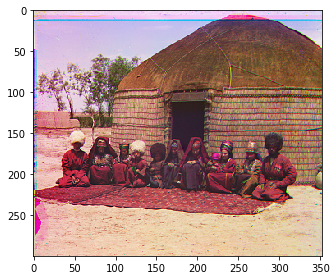

After


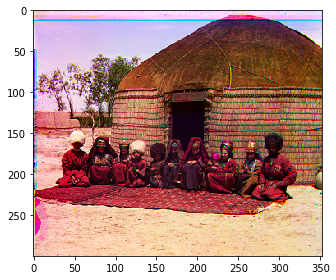

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


Before


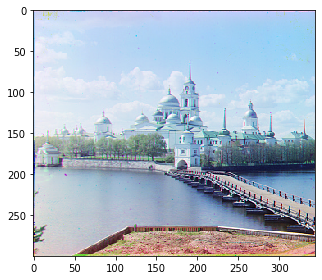

After


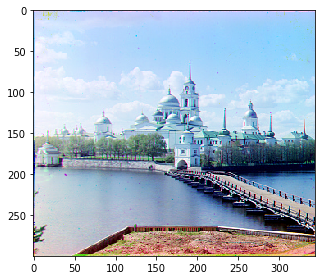

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


Before


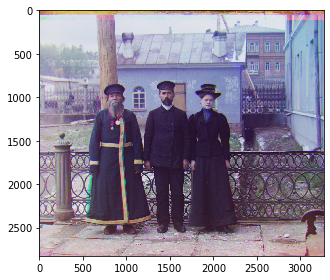

After


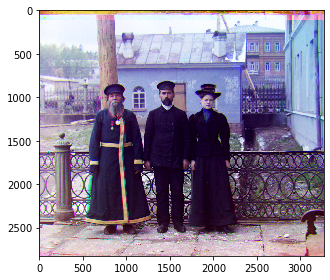

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


Before


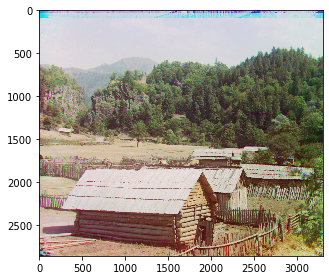

After


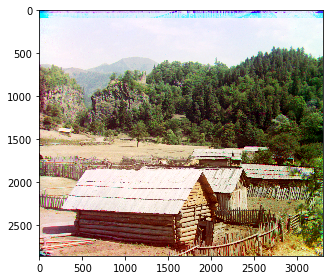

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


Before


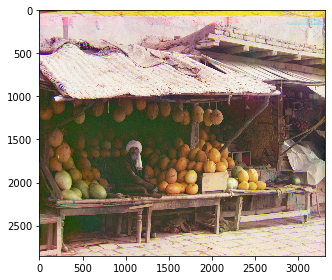

After


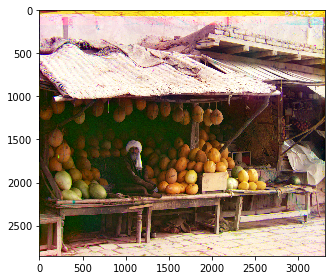

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


Before


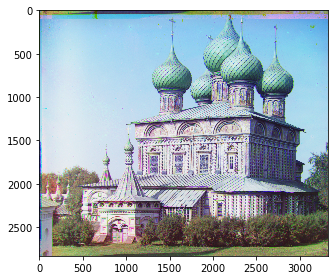

After


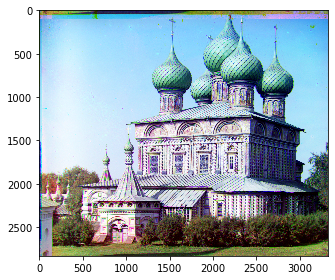

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


Before


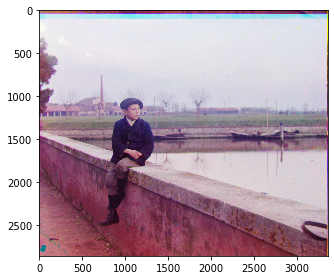

After


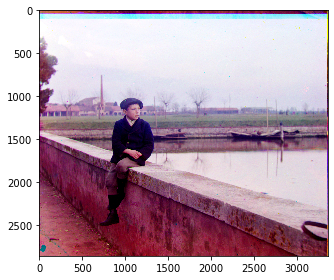

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


Before


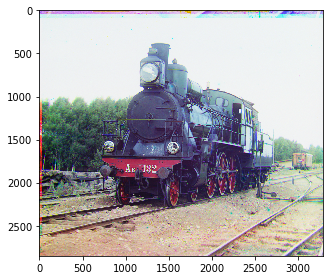

After


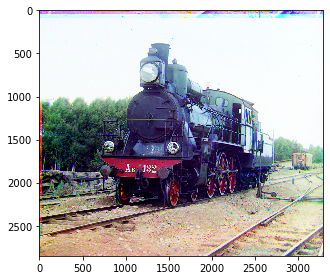

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


Before


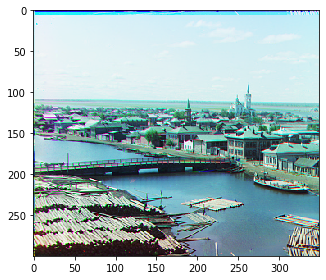

After


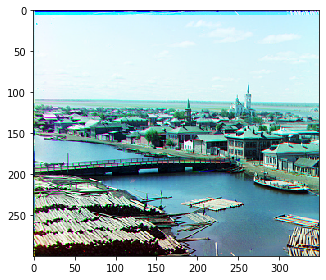

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


Before


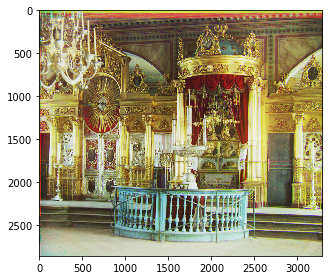

After


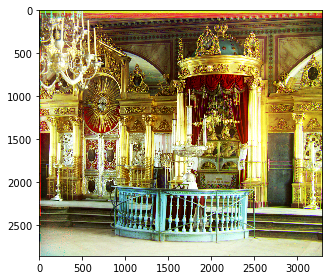

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


Before


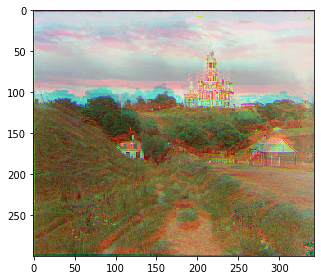

After


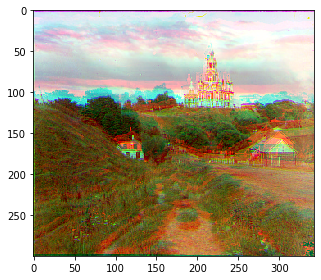

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


Before


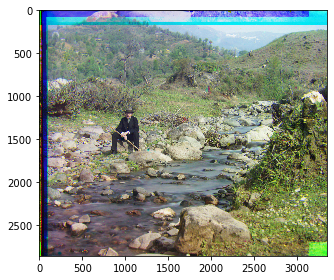

After


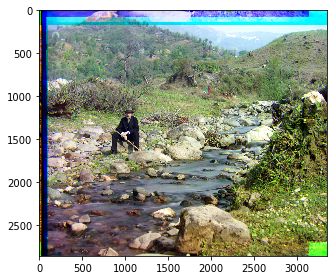

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


Before


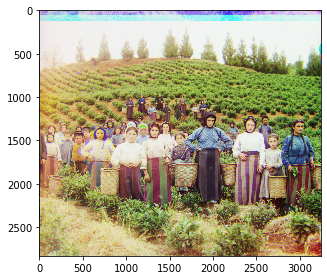

After


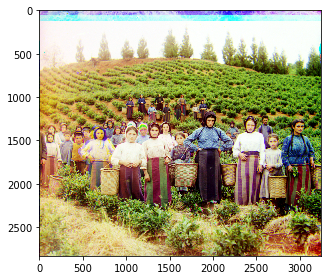

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


Before


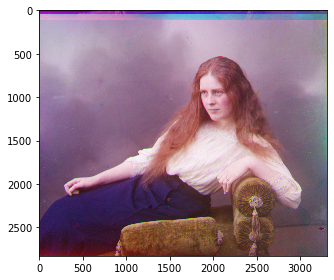

After


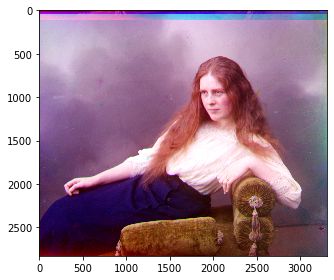

In [29]:
for file, img in colorized:
    contrast = add_contrast(img, file)
    print("Before")
    skio.imshow(img)
    skio.show()
    print("After")
    skio.imshow(contrast)
    skio.show()